## User Engegement Analysis

***Expectation***
 - session frequency
 - duration session
 - session total traffic(DL+UL)

#### Import packages


In [36]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sys
import os

sys.path.append(os.path.abspath(os.path.join("../script")))
from data_clean_handler import CleanData
from get_dataframe_information import DataFrameInformation


In [37]:
import logging
logging.basicConfig(filename='../logfile.log', filemode='a',
                    encoding='utf-8', level=logging.DEBUG)

#### Read the cleaned dataframe 

In [38]:
try:
    df = pd.read_csv('../data/clean_data.csv')
except BaseException:
    logging.error('file not found or wrong format')


/var/folders/6b/0t1qb1d92f72c46kvp35pwfc0000gn/T/ipykernel_51378/1400606392.py:2: DtypeWarning: Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('../data/clean_data.csv')


In [39]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 148935 entries, 0 to 148934
Data columns (total 45 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   Bearer Id                       148935 non-null  object 
 1   Start                           148935 non-null  object 
 2   Start ms                        148935 non-null  float64
 3   End                             148935 non-null  object 
 4   End ms                          148935 non-null  float64
 5   Dur. (ms)                       148935 non-null  float64
 6   IMSI                            148935 non-null  float64
 7   MSISDN/Number                   148935 non-null  float64
 8   IMEI                            148935 non-null  float64
 9   Last Location Name              148935 non-null  object 
 10  Avg RTT DL (ms)                 148935 non-null  float64
 11  Avg RTT UL (ms)                 148935 non-null  float64
 12  Avg Bearer TP DL

In [40]:
df.columns

Index(['Bearer Id', 'Start', 'Start ms', 'End', 'End ms', 'Dur. (ms)', 'IMSI',
       'MSISDN/Number', 'IMEI', 'Last Location Name', 'Avg RTT DL (ms)',
       'Avg RTT UL (ms)', 'Avg Bearer TP DL (kbps)', 'Avg Bearer TP UL (kbps)',
       'DL TP < 50 Kbps (%)', '50 Kbps < DL TP < 250 Kbps (%)',
       '250 Kbps < DL TP < 1 Mbps (%)', 'DL TP > 1 Mbps (%)',
       'UL TP < 10 Kbps (%)', '10 Kbps < UL TP < 50 Kbps (%)',
       '50 Kbps < UL TP < 300 Kbps (%)', 'UL TP > 300 Kbps (%)',
       'Activity Duration DL (ms)', 'Activity Duration UL (ms)', 'Dur. (ms).1',
       'Handset Manufacturer', 'Handset Type', 'Nb of sec with Vol DL < 6250B',
       'Nb of sec with Vol UL < 1250B', 'Social Media DL (Bytes)',
       'Social Media UL (Bytes)', 'Google DL (Bytes)', 'Google UL (Bytes)',
       'Email DL (Bytes)', 'Email UL (Bytes)', 'Youtube DL (Bytes)',
       'Youtube UL (Bytes)', 'Netflix DL (Bytes)', 'Netflix UL (Bytes)',
       'Gaming DL (Bytes)', 'Gaming UL (Bytes)', 'Other DL (Bytes)',


In [41]:
to_string = ['IMEI', 'IMSI', 'MSISDN/Number']

for col in to_string:
    df[col] = df[col].astype('category')


In [42]:
from unicodedata import category
df.describe(exclude=[object,'category'])


,Start ms,End ms,Dur. (ms),Avg RTT DL (ms),Avg RTT UL (ms),Avg Bearer TP DL (kbps),Avg Bearer TP UL (kbps),DL TP < 50 Kbps (%),50 Kbps < DL TP < 250 Kbps (%),250 Kbps < DL TP < 1 Mbps (%),...,Youtube DL (Bytes),Youtube UL (Bytes),Netflix DL (Bytes),Netflix UL (Bytes),Gaming DL (Bytes),Gaming UL (Bytes),Other DL (Bytes),Other UL (Bytes),Total UL (Bytes),Total DL (Bytes)
count,148935.000000,148935.000000,1.489350e+05,148935.000000,148935.000000,148935.000000,148935.000000,148935.000000,148935.000000,148935.000000,...,1.489350e+05,1.489350e+05,1.489350e+05,1.489350e+05,1.489350e+05,1.489350e+05,1.489350e+05,1.489350e+05,1.489350e+05,1.489350e+05
mean,499.246732,498.675442,1.048702e+05,93.334132,15.293235,13286.171390,1770.786497,92.898889,3.043106,1.705449,...,1.163345e+07,1.100867e+07,1.162756e+07,1.100017e+07,4.220256e+08,8.289085e+06,4.211473e+08,8.263189e+06,4.111764e+07,4.546251e+08
std,288.555630,288.089136,8.106343e+04,537.222862,76.683630,23978.591234,4629.475837,13.006268,6.195882,4.149469,...,6.711384e+06,6.345428e+06,6.724686e+06,6.358918e+06,2.439763e+08,4.782090e+06,2.431970e+08,4.768708e+06,1.127933e+07,2.441528e+08
min,0.000000,0.000000,7.142000e+03,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,5.300000e+01,1.050000e+02,4.200000e+01,3.500000e+01,2.516000e+03,5.900000e+01,3.290000e+03,1.480000e+02,2.866892e+06,7.114041e+06
25%,250.000000,251.000000,5.788350e+04,28.000000,3.000000,43.000000,47.000000,91.000000,0.000000,0.000000,...,5.831331e+06,5.516710e+06,5.779947e+06,5.474451e+06,2.104587e+08,4.130162e+06,2.102119e+08,4.145072e+06,3.321774e+07,2.430996e+08
50%,499.000000,500.000000,8.639900e+04,38.000000,5.000000,63.000000,63.000000,100.000000,0.000000,0.000000,...,1.161638e+07,1.101329e+07,1.164269e+07,1.099563e+07,4.234208e+08,8.291222e+06,4.218716e+08,8.266089e+06,4.114101e+07,4.558708e+08
75%,749.000000,750.000000,1.327000e+05,62.000000,11.000000,19681.000000,1117.000000,100.000000,4.000000,1.000000,...,1.744571e+07,1.651442e+07,1.747072e+07,1.650429e+07,6.331620e+08,1.243184e+07,6.316602e+08,1.238204e+07,4.903248e+07,6.656577e+08
max,999.000000,999.000000,1.859336e+06,96923.000000,7120.000000,378160.000000,58613.000000,100.000000,93.000000,100.000000,...,2.325910e+07,2.201196e+07,2.325919e+07,2.201196e+07,8.434419e+08,1.655879e+07,8.434425e+08,1.655882e+07,7.833131e+07,9.029696e+08


### Task 2.1

1. Duration of the session

In [43]:
total_duration = df.groupby('MSISDN/Number').agg(
    {'Dur. (ms)': 'sum'}).reset_index().rename(columns={'Dur. (ms)': 'total_duration'})

total_duration

,MSISDN/Number,total_duration
0,3.360100e+10,116720.0
1,3.360100e+10,181230.0
2,3.360100e+10,134969.0
3,3.360101e+10,49878.0
4,3.360101e+10,37104.0
...,...,...
106851,3.379000e+10,8810.0
106852,3.379000e+10,140988.0
106853,3.197021e+12,877385.0
106854,3.370000e+14,253030.0


2. Session total traffic 

In [44]:
datainfo = DataFrameInformation(df)
dl_columns = datainfo.get_column_with_string(df, 'DL \(Bytes\)')
total_download = df.groupby(
    'MSISDN/Number').agg({c: 'sum' for c in dl_columns}).sum(axis=1)
total_download = pd.DataFrame(total_download).reset_index().rename(
    columns={0: 'total_download'})
total_download


,MSISDN/Number,total_download
0,3.360100e+10,2.062372e+09
1,3.360100e+10,5.210681e+08
2,3.360100e+10,1.608406e+09
3,3.360101e+10,8.292343e+08
4,3.360101e+10,3.503905e+09
...,...,...
106851,3.379000e+10,1.667242e+09
106852,3.379000e+10,1.093786e+09
106853,3.197021e+12,8.573342e+08
106854,3.370000e+14,1.223624e+09


In [45]:
ul_columns = datainfo.get_column_with_string(df, 'UL \(Bytes\)')
total_upload = df.groupby('MSISDN/Number').agg({c:'sum' for c in ul_columns}).sum(axis=1)
total_upload = pd.DataFrame(total_upload).reset_index().rename(columns={0:'total_upload'})
total_upload


,MSISDN/Number,total_upload
0,3.360100e+10,72106216.0
1,3.360100e+10,72208918.0
2,3.360100e+10,78613640.0
3,3.360101e+10,40655052.0
4,3.360101e+10,188561054.0
...,...,...
106851,3.379000e+10,53432858.0
106852,3.379000e+10,71464486.0
106853,3.197021e+12,74591830.0
106854,3.370000e+14,113305678.0


In [46]:
total_traffic = total_download.merge(total_upload, on='MSISDN/Number')

#convert bytes ot Mega Bytes
# cleaner = CleanData(total_traffic)

# total_traffic = cleaner.convert_bytes_to_megabytes(
#     total_traffic, ['total download', 'total upload'])
total_traffic

,MSISDN/Number,total_download,total_upload
0,3.360100e+10,2.062372e+09,72106216.0
1,3.360100e+10,5.210681e+08,72208918.0
2,3.360100e+10,1.608406e+09,78613640.0
3,3.360101e+10,8.292343e+08,40655052.0
4,3.360101e+10,3.503905e+09,188561054.0
...,...,...,...
106851,3.379000e+10,1.667242e+09,53432858.0
106852,3.379000e+10,1.093786e+09,71464486.0
106853,3.197021e+12,8.573342e+08,74591830.0
106854,3.370000e+14,1.223624e+09,113305678.0


3. Sessions Frequency

In [47]:
new_df = total_traffic.merge(total_duration, on='MSISDN/Number')
new_df = new_df.select_dtypes(exclude='category')
new_df

,total_download,total_upload,total_duration
0,2.062372e+09,72106216.0,116720.0
1,5.210681e+08,72208918.0,181230.0
2,1.608406e+09,78613640.0,134969.0
3,8.292343e+08,40655052.0,49878.0
4,3.503905e+09,188561054.0,37104.0
...,...,...,...
106851,1.667242e+09,53432858.0,8810.0
106852,1.093786e+09,71464486.0,140988.0
106853,8.573342e+08,74591830.0,877385.0
106854,1.223624e+09,113305678.0,253030.0


## Normalization and k-means clustering with k=3

1. mean normalization

In [48]:
normalized_df=(new_df - new_df.mean())/new_df.std()
normalized_df

,total_download,total_upload,total_duration
0,0.167093,-0.596122,-0.158013
1,-1.070640,-0.594682,0.188147
2,-0.197461,-0.504873,-0.060089
3,-0.823169,-1.037138,-0.516687
4,1.324706,1.036835,-0.585233
...,...,...,...
106851,-0.150213,-0.857964,-0.737058
106852,-0.610723,-0.605121,-0.027791
106853,-0.800604,-0.561268,3.923713
106854,-0.506458,-0.018414,0.573426


2. k-means clustering

In [49]:
from sklearn.cluster import KMeans
Kmean = KMeans(n_clusters=3)
Kmean.fit(normalized_df)

centroids = Kmean.cluster_centers_


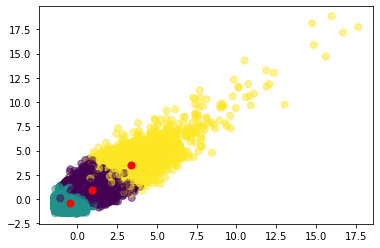

In [51]:
plt.scatter(normalized_df['total_download'], normalized_df['total_upload'],
            c=Kmean.labels_.astype(float), s=50, alpha=0.5)
plt.scatter(centroids[:, 0], centroids[:, 1], c='red', s=50)
plt.show()


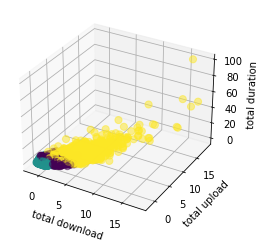

In [59]:
# Create the figure
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Generate the values
x_vals = normalized_df['total_download']
y_vals = normalized_df['total_upload']
z_vals = normalized_df['total_duration']

# Plot the values
ax.scatter(x_vals, y_vals, z_vals, 
           c=Kmean.labels_.astype(float), s=50, alpha=0.5)
ax.scatter(centroids[:, 0], centroids[:, 1],centroids[:,2], c='red', s=50)

ax.set_xlabel('total download')
ax.set_ylabel('total upload')
ax.set_zlabel('total duration')

plt.show()


In [62]:
import plotly.express as px
fig = px.scatter_3d(normalized_df, x='total_upload', y='total_download', z='total_duration',
                    color=Kmean.labels_.astype(float))
fig.show()
